# Assignment 3 - Text Analysis
An explanation this assignment could be found in the .pdf explanation document


## Materials to review for this assignment
<h4>From Moodle:</h4> 
<h5><u>Review the notebooks regarding the following python topics</u>:</h5>
<div class="alert alert-info">
&#x2714; <b>Working with strings</b> (tutorial notebook)<br/>
&#x2714; <b>Text Analysis</b> (tutorial notebook)<br/>
&#x2714; <b>Hebrew text analysis tools (tokenizer, wordnet)</b> (moodle example)<br/>
&#x2714; <b>(brief review) All previous notebooks</b><br/>
</div> 
<h5><u>Review the presentations regarding the following topics</u>:</h5>
<div class="alert alert-info">
&#x2714; <b>Text Analysis</b> (lecture presentation)<br/>
&#x2714; <b>(brief review) All other presentations</b><br/>
</div>

## Personal Details:

In [2]:
# Details Student 1: בר הרוש 
# Details Student 2: מתן מאיר כצנלסון 

## Preceding Step - import modules (packages)
This step is necessary in order to use external modules (packages). <br/>

In [4]:
# --------------------------------------
import pandas as pd
import numpy as np
# --------------------------------------


# --------------------------------------
# ------------- visualizations:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
# --------------------------------------


# ---------------------------------------
import sklearn
from sklearn import preprocessing, metrics, pipeline, model_selection, feature_extraction 
from sklearn import naive_bayes, linear_model, svm, neural_network, neighbors, tree
from sklearn import decomposition, cluster

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV 
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import mean_squared_error, r2_score, silhouette_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder

from sklearn.svm import LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import Perceptron, SGDClassifier
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
# ---------------------------------------


# ----------------- output and visualizations: 
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore", category=ConvergenceWarning)
# show several prints in one cell. This will allow us to condence every trick in one cell.
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline
pd.pandas.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
# ---------------------------------------

### Text analysis and String manipulation imports:

In [5]:
# --------------------------------------
# --------- Text analysis and Hebrew text analysis imports:
# vectorizers:
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# regular expressions:
import re
# --------------------------------------

### (optional) Hebrew text analysis - WordNet (for Hebrew)
Note: the WordNet is not a must

#### (optional) Only if you didn't install Wordnet (for Hebrew) use:

In [ ]:
# word net installation:

# unmark if you want to use and need to install
!pip install wn
!python -m wn download omw-he:1.4

In [6]:
# word net import:

# unmark if you want to use:
import wn

### (optional) Hebrew text analysis - hebrew_tokenizer (Tokenizer for Hebrew)
Note: the hebrew_tokenizer is not a must

#### (optional) Only if you didn't install hebrew_tokenizer use:

In [ ]:
# Hebrew tokenizer installation:

# unmark if you want to use and need to install:
# !pip install hebrew_tokenizer

In [ ]:
# Hebrew tokenizer import:

# unmark if you want to use:
import hebrew_tokenizer as ht

### Reading input files
Reading input files for train annotated corpus (raw text data) corpus and for the test corpus

In [6]:
train_filename = 'annotated_corpus_for_train.csv'
test_filename  = 'corpus_for_test.csv'
df_train = pd.read_csv(train_filename, index_col=None, encoding='utf-8')
df_test  = pd.read_csv(test_filename, index_col=None, encoding='utf-8')

In [7]:
df_train.head(8)
df_train.shape

,story,gender
0,"כשחבר הזמין אותי לחול, לא באמת חשבתי שזה יקרה,...",m
1,לפני שהתגייסתי לצבא עשיתי כל מני מיונים ליחידו...,m
2,מאז שהתחילו הלימודים חלומו של כל סטודנט זה הפנ...,f
3,"כשהייתי ילד, מטוסים היה הדבר שהכי ריתק אותי. ב...",m
4,‏הייתי מדריכה בכפר נוער ומתאם הכפר היינו צריכי...,f
5,לפני כ3 חודשים טסתי לרומא למשך שבוע. טסתי במטו...,f
6,אני כבר שנתיים נשוי והשנה אני ואישתי סוף סוף י...,m
7,השנה התחלנו שיפוץ בדירה שלנו בתל אביב. הדירה ה...,f


(753, 2)

In [8]:
df_test.head(3)
df_test.shape

,test_example_id,story
0,0,כל קיץ אני והמשפחה נוסעים לארצות הברית לוס אנג...
1,1,"הגעתי לשירות המדינה אחרי שנתיים כפעיל בתנועת ""..."
2,2,אחת האהבות הגדולות שלי אלו הכלבים שלי ושל אישת...


(323, 2)

The first thing we will do is clean the information we received and check if we received missing or duplicate information
We saw that there are duplicates in the training group and the test group is clean

### Your implementation:
Write your code solution in the following code-cells

In [9]:
df_train.shape
df_test.shape

(753, 2)

(323, 2)

In [ ]:
new_df = df_train.drop_duplicates()
new_df.dropna()


we will use the Hebrew tokenizer In order to create tokens and filter those that are not in Hebrew and changing the gender column to 0 and 1

In [15]:
def identify_objects(story):
    objects = []

    tokens = ht.tokenize(story)
    for group, token, token_num, (start_index, end_index) in tokens:
        if group == 'HEBREW':
            objects.append((token, 'Hebrew'))
    
    return objects

# Apply the function to each row in the 'story' column
new_df['tokenized_words'] = new_df['story'].apply(identify_objects)



In [16]:
def extract_first_words(tokens):
    words = [token[0] for token in tokens]  # Extract words from the first position
    return ' '.join(words)

# Apply word extraction function to each row in the 'filtered_tokens' column
new_df['extracted_words'] = new_df['tokenized_words'].apply(extract_first_words)

In [22]:
combined_df = pd.concat([new_df['extracted_words'], new_df['gender']], axis=1)
# combined_df.to_csv('new_combined_data.csv', index=False)
combined_df['gender'] = combined_df['gender'].replace({'m': 1, 'f': 0})
combined_df.head()
# Count occurrences of each value in the 'gender' column
gender_counts = combined_df['gender'].value_counts()

print("Number of 0's:", gender_counts[0])
print("Number of 1's:", gender_counts[1])


,extracted_words,gender
0,כשחבר הזמין אותי לחול לא באמת חשבתי שזה יקרה פ...,1
1,לפני שהתגייסתי לצבא עשיתי כל מני מיונים ליחידו...,1
2,מאז שהתחילו הלימודים חלומו של כל סטודנט זה הפנ...,0
3,כשהייתי ילד מטוסים היה הדבר שהכי ריתק אותי בתו...,1
4,הייתי מדריכה בכפר נוער ומתאם הכפר היינו צריכים...,0


Number of 0's: 177
Number of 1's: 573


We will carry out a similar process for the information available in the test group.

In [ ]:
new_df_test = df_test.drop_duplicates()
new_df_test.dropna()


Do the same for the test 

In [19]:
extracted_words_df = pd.DataFrame()
# Apply the function to each row in the 'story' column
extracted_words_df['tokenized_words'] = new_df_test['story'].apply(identify_objects)
# Apply word extraction function to each row in the 'filtered_tokens' column
extracted_words_df['extracted_words'] = extracted_words_df['tokenized_words'].apply(extract_first_words)



In [21]:
new_df_test  = extracted_words_df[['extracted_words']].copy()
new_df_test.head()

,extracted_words
0,כל קיץ אני והמשפחה נוסעים לארצות הברית לוס אנג...
1,הגעתי לשירות המדינה אחרי שנתיים כפעיל בתנועת י...
2,אחת האהבות הגדולות שלי אלו הכלבים שלי ושל אישת...
3,רגע הגיוס לצבא היה הרגע הכי משמעותי עבורי אני ...
4,אני הגעתי לברזיל ישר מקולומביה וגם אני עשיתי ע...


In order to test different amounts of vectors and whether this affects ML, we will create some data frames that will contain different amounts of the most popular vectors from the text (referring to the most used words)

In [ ]:

max_features_values = [50, 100, 500, 1000, 10000]
ngram_ranges = [(1, 1), (1, 2), (1, 3)]  # Unigrams, Bigrams, and Trigrams
vectorizer_types = ['CountVectorizer', 'TfidfVectorizer']

dataframes = {}  # To store dataframes for different vectorization types and parameters

for vectorizer_type in vectorizer_types:
    vectorizer_type_data = {}  # To store dataframes for a specific vectorization type
    
    for max_features in max_features_values:
        for ngram_range in ngram_ranges:
            # Create the appropriate vectorizer instance
            if vectorizer_type == 'CountVectorizer':
                vectorizer = CountVectorizer(max_features=max_features, ngram_range=ngram_range)
            elif vectorizer_type == 'TfidfVectorizer':
                vectorizer = TfidfVectorizer(max_features=max_features, ngram_range=ngram_range)
            
            # Fit and transform the extracted_words column
            word_counts = vectorizer.fit_transform(combined_df['extracted_words'])
            
            # Convert the resulting matrix to a DataFrame
            word_counts_df = pd.DataFrame(word_counts.toarray(), columns=vectorizer.get_feature_names_out())
            
            # Store the dataframe for this configuration
            key = f"{vectorizer_type}_MaxFeatures_{max_features}_Ngram_{ngram_range}"
            vectorizer_type_data[key] = word_counts_df
    
    # Store the dataframes for this vectorization type
    dataframes[vectorizer_type] = vectorizer_type_data

# Display all the generated dataframes
for vectorizer_type, vectorizer_type_data in dataframes.items():
    print(f"{vectorizer_type}:")
    for key, dataframe in vectorizer_type_data.items():
        print(key)
        print(dataframe)
        print("=" * 40)



The following code makes it possible to reach different data frames in order to put them into machine learning

In [ ]:
# Specify the values you're interested in
target_max_features = 10000
target_ngram_range = (1, 3)
target_vectorizer_type = 'TfidfVectorizer'

# Retrieve the specific dataframe
target_key = f"{target_vectorizer_type}_MaxFeatures_{target_max_features}_Ngram_{target_ngram_range}"
target_dataframe = dataframes[target_vectorizer_type][target_key]

# Print the retrieved dataframe
target_key
target_dataframe


After a very long test we found that a large amount of vectors contributes more to accurate results and there is no significant difference between CountVectorizer and TfidfVectorizer

We will prepare a short function to display data frames and check them again on the machine learnings below

In [ ]:
max_features_values = [50,100,500,1000,10000]
dataframes = []  # To store dataframes for different max_features_values

for max_features in max_features_values:
    # Create a CountVectorizer instance
    vectorizer = CountVectorizer(max_features=max_features) # optional: 
    
    # Fit and transform the extracted_words column
    word_counts = vectorizer.fit_transform(combined_df['extracted_words'])
    
    # Convert the resulting matrix to a DataFrame
    word_counts_df = pd.DataFrame(word_counts.toarray(), columns=vectorizer.get_feature_names_out())
    
    print(f"Max Features: {max_features}")
    print(word_counts_df)
    print("=" * 40)
    
    dataframes.append(word_counts_df)

# Access the separate dataframes
df_max_features_50 = dataframes[0]
df_max_features_100 = dataframes[1]
df_max_features_500 = dataframes[2]
df_max_features_1000 = dataframes[3]
df_max_features_10000 = dataframes[4]


In [24]:
df_max_features_10000.head()

,אאוט,אבא,אבבה,אבטלה,אבי,אביב,אביה,אבל,אבן,אבק,אגב,אגודת,אגיע,אגם,אדום,אדומה,אדומות,אדון,אדם,אדמה,אה,אהב,אהבה,אהבו,אהבנו,אהבתי,אהיה,או,אוגוסט,אודות,אודישן,אודם,אוהב,אוהבים,אוהבת,אוהד,אוהדי,אוהדים,אוהל,אוהלים,אוויר,אווירה,אוטו,אוטובוס,אוטובוסים,אוטומטי,אוטומציה,אוי,אוכל,אוכלים,אולי,אולם,אולמות,אומנה,אומנם,אומץ,אומר,אומרים,אומרת,אונים,אונליין,אופטימיים,אופי,אופייני,אופן,אופנוע,אופניים,אופציה,אוציא,אוקטובר,אוקיי,אור,אורות,אורז,אורח,אורחים,אורט,אורך,אושפזתי,אושר,אושרה,אות,אותה,אותו,אותי,אותך,אותם,אותן,אותנו,אותנטי,אז,אזור,אזורים,אזכה,אזכור,אזעקה,אזרח,אזרחות,אח,אחד,אחווה,אחוז,אחוזים,אחורה,אחות,אחותה,אחותי,אחזור,אחי,אחיי,אחים,אחלה,אחר,אחראי,אחראית,אחרון,אחרונה,אחרונים,אחרות,אחרי,אחריה,אחריו,אחריות,אחריי,אחרים,אחרינו,אחרת,אחת,אט,אטוס,אטרקציות,אי,איבד,איבדתי,איזה,איזו,איזור,איזשהו,איחר,איטית,איטליה,איטלקי,איטלקית,איי,איים,איך,איכות,איכותי,איכשהו,אילו,אילוצי,אילת,אימה,אימון,אימונים,אימוץ,אימצנו,אין,אינה,אינו,אינטנסיבי,אינטנסיבית,אינטרנט,אינטרנטי,איני,אינם,אינני,אינסופי,אינספור,איסטנבול,איפה,איפיון,איפשהו,אירו,אירוע,אירועים,אירופה,איש,אישה,אישור,אישורים,אישי,אישיות,אישיים,אישית,אישפוז,אישתי,איתה,איתו,איתי,איתך,איתם,איתן,איתנו,אך,אכין,אכל,אכלנו,אכלתי,אכן,אכפת,אכתוב,אל,אלא,אלגוריתמים,אלה,אלו,אלונקה,אלחוטי,אלי,אליה,אליהם,אליהן,אליו,אליי,אליך,אלינו,אלך,אלכוהול,אלמוג,אלמוגים,אלף,אלפי,אלפים,אלקטרוניקה,אם,אמא,אמבולנס,אמור,אמורה,אמורות,אמורים,אמי,אמין,אמיר,אמיתי,אמיתיים,אמיתית,אמנם,אמסטרדם,אמצא,אמצע,אמצעי,אמצעים,אמר,אמרה,אמרו,אמריקאי,אמריקה,אמרנו,אמרתי,אמשיך,אמת,אנג,אנגלית,אנד,אנו,אנוש,אנחנו,אני,אנס,אנסה,אנרגיה,אנרגיות,אנשי,אנשים,אסור,אסיר,אסף,אספנו,אספר,אספתי,אעשה,אף,אפ,אפור,אפילו,אפל,אפליקציה,אפליקציות,אפס,אפסיק,אפריל,אפריקה,אפשר,אפשרויות,אפשרות,אפשרי,אפשרית,אצטרך,אצטרף,אצל,אצלה,אצלו,אצלי,אצליח,אצלינו,אצלם,אצלנו,אקבל,אקח,אקסטרים,אראה,ארבע,ארבעה,ארבעים,ארגון,ארגנו,ארוחה,ארוחות,ארוחת,ארוך,ארוכה,ארוכות,ארוכים,ארון,ארוסתי,ארזנו,ארזתי,ארי,ארכה,ארמון,ארנבת,ארסי,ארץ,ארצה,ארצות,אש,אשדוד,אשכח,אשכרה,אשפה,אשקר,אשר,אשראי,אשת,אשתו,אשתי,אשתף,את,אתגר,אתגרים,אתה,אתו,אתחיל,אתכם,אתם,אתמול,אתן,אתר,אתרי,אתרים,בא,באגם,באדיקות,באה,באו,באוגוסט,באוהל,באוויר,באווירה,באוזן,באוטו,באוטובוס,באוטובוסים,באוטומטים,באולם,באופן,באופניים,באופק,באוקטובר,באור,באורך,באותה,באותו,באותם,באותן,באזור,באזורים,באזרחות,באחד,באחת,באי,באיזה,באיזור,באיזשהו,באיחור,באיטליה,באילת,באים,באימון,באינטרנט,באיצטדיון,באירוע,באירופה,באכסנייה,באליפות,באמבולנס,באמסטרדם,באמצע,באמצעות,באמריקה,באמת,באנג,באנגלית,באנו,באנרגיה,באנשים,באסה,באף,באפליקציה,באפריל,באפריקה,באצטדיון,באר,בארבע,בארגון,בארוחת,בארון,בארץ,בארצות,באש,באשדוד,באתי,באתר,באתרים,בבאר,בבגדים,בבדיקה,בבהלה,בבודפשט,בבוקר,בבטן,בבידוד,בביטחון,בבית,בביתו,בביתי,בבן,בבניין,בבסיס,בבעיה,בבקרים,בבקשה,בבר,בבריכה,בברך,בברצלונה,בבת,בבתי,בבתים,בג,בגב,בגד,בגדול,בגדי,בגדים,בגדר,בגובה,בגוגל,בגודל,בגוף,בגופי,בגיל,בגילי,בגינה,בגלגל,בגלל,בגן,בגרות,בגרמניה,בגשם,בד,בדבר,בדברים,בדובאי,בדוי,בדחיפות,בדיוטי,בדיוק,בדייט,בדיעבד,בדיקה,בדיקות,בדיקת,בדירה,בדירת,בדכ,בדלפק,בדלת,בדצמבר,בדק,בדקה,בדקו,בדקנו,בדקתי,בדרום,בדרך,בדרכו,בדרכי,בדרכים,בדרכנו,בה,בהבנה,בהגיענו,בהגעה,בהדרגה,בהודו,בהודעה,בהוסטל,בהופעה,בהוצאות,בהזמנה,בהזמנות,בהחלט,בהחלטה,בהיותי,בהיי,בהייטק,בהימור,בהיר,בהכל,בהכנות,בהליך,בהליכה,בהלם,בהם,בהמון,בהמשך,בהן,בהפסקה,בהפסקות,בהפרש,בהפתעה,בהצטיינות,בהצלחה,בהקדם,בהר,בהרבה,בהרגשה,בהרי,בהריון,בהרים,בהרכב,בהרצליה,בהתאם,בהתחלה,בהתחשב,בהתלהבות,בהתקף,בהתרגשות,בו,בוא,בואו,בובה,בובות,בוגר,בוגרי,בודד,בודדות,בודדים,בודק,בוודאות,בוויז,בווירוס,בווצאפ,בוחר,בוטלו,בוינה,בוכה,בול,בולגריה,בום,בונוס,בופה,בוצעה,בוק,בוקר,בורג,בורקס,בורקסים,בושם,בזבוז,בזה,בזהירות,בזוגיות,בזול,בזום,בזיכרון,בזכות,בזכותו,בזמן,בזמנו,בזמני,בזמנים,בזריזות,בזריחה,בחבורה,בחבילה,בחברה,בחברות,בחברת,בחג,בחדר,בחדרי,בחדרים,בחדשות,בחו,בחוג,בחודש,בחודשי,בחוויה,בחוויות,בחוזה,בחוזקה,בחול,בחולון,בחום,בחומר,בחוסר,בחוף,בחופים,בחופשה,בחופשיות,בחוץ,בחור,בחורה,בחורים,בחורף,בחושך,בחזור,בחזית,בחזרה,בחטיבת,בחיוב,בחיוך,בחיי,בחייו,בחיים,בחיינו,בחיל,בחילות,בחינם,בחיפה,בחיפוש,בחיפושים,בחיק,בחירה,בחירת,בחלום,בחלון,בחליפה,בחליפות,בחלל,בחלק,בחמישי,בחמש,בחנויות,בחנות,בחניה,בחניון,בחצי,בחצר,בחר,בחרה,בחרו,בחרמון,בחרנו,בחרתי,בחשבון,בחשש,בחתונה,בט

For the data structure, we tried a different number of vectors each time in order to check whether the amount of vectors has a good effect on learning.

In [25]:
X = df_max_features_10000 # Each time we changed the data frame we got the best results when there are more vectors, there is a concern that we are approaching overfitting
y = combined_df['gender']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



We will perform a test on different learning machines, since we are looking for the most suitable model, we will not test everything, just a simple test that will include GridSearchCV for the most suitable parameters. 

In [169]:

# Define the parameter grid for grid search
param_grid = {
    'classifier__max_depth': [3, 5, 7, 10, 15],
    'classifier__min_samples_split': [2, 5, 10]
}

# Create a DecisionTreeClassifier instance
decision_tree_classifier = DecisionTreeClassifier(random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Standardize features
    ('classifier', decision_tree_classifier)
])

# Create a GridSearchCV instance
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_macro', verbose=1)

# Perform cross-validation
f1_scores = cross_val_score(grid_search, X_train, y_train, cv=5, scoring='f1_macro')

# Print cross-validation F1 scores
print("Cross-Validation F1 Scores:", f1_scores)
print("Mean F1 Score:", f1_scores.mean())

# Fit the grid search to the dataש
grid_search.fit(X_train, y_train)

# Get the best estimator and predict on test data
best_decision_tree = grid_search.best_estimator_
best_params = grid_search.best_params_
y_pred = best_decision_tree.predict(X_test)


f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)


F1_avg = (f1_male + f1_female) / 2

print("Best Hyperparameters:", best_params)

print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)


Fitting 5 folds for each of 15 candidates, totalling 75 fits
Fitting 5 folds for each of 15 candidates, totalling 75 fits
Fitting 5 folds for each of 15 candidates, totalling 75 fits
Fitting 5 folds for each of 15 candidates, totalling 75 fits
Fitting 5 folds for each of 15 candidates, totalling 75 fits
Cross-Validation F1 Scores: [0.51591215 0.58918664 0.58       0.55201291 0.58990189]
Mean F1 Score: 0.5654027167702822
Fitting 5 folds for each of 15 candidates, totalling 75 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier',
                                        DecisionTreeClassifier(random_state=42))]),
             param_grid={'classifier__max_depth': [3, 5, 7, 10, 15],
                         'classifier__min_samples_split': [2, 5, 10]},
             scoring='f1_macro', verbose=1)

Best Hyperparameters: {'classifier__max_depth': 15, 'classifier__min_samples_split': 5}
F1 Score (Male): 0.8582995951417004
F1 Score (Female): 0.33962264150943394
F1 Average Score: 0.5989611183255672


In [365]:
# Define the parameter grid for grid search
param_grid = {
    'classifier__hidden_layer_sizes': [(100,), (50, 50), (30, 20, 10)],
    'classifier__alpha': [0.0001, 0.001, 0.01],
}

# Create an MLPClassifier instance
mlp_classifier = MLPClassifier(random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Standardize features
    ('classifier', mlp_classifier)
])

# Create a GridSearchCV instance
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_macro', verbose=1)

# Perform cross-validation
f1_scores = cross_val_score(grid_search, X_train, y_train, cv=5, scoring='f1_macro')

# Print cross-validation F1 scores
print("Cross-Validation F1 Scores:", f1_scores)
print("Mean F1 Score:", f1_scores.mean())

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best estimator and predict on test data
best_mlp = grid_search.best_estimator_
best_params = grid_search.best_params_
y_pred = best_mlp.predict(X_test)


f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)

F1_avg = (f1_male + f1_female) / 2

print("Best Hyperparameters:", best_params)

print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Cross-Validation F1 Scores: [0.65186813 0.59517045 0.62369692 0.6        0.65116279]
Mean F1 Score: 0.6243796601158703
Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier',
                                        MLPClassifier(random_state=42))]),
             param_grid={'classifier__alpha': [0.0001, 0.001, 0.01],
                         'classifier__hidden_layer_sizes': [(100,), (50, 50),
                                                            (30, 20, 10)]},
             scoring='f1_macro', verbose=1)

Best Hyperparameters: {'classifier__alpha': 0.01, 'classifier__hidden_layer_sizes': (50, 50)}
F1 Score (Male): 0.8214285714285715
F1 Score (Female): 0.47368421052631576
F1 Average Score: 0.6475563909774437


In [171]:

# Define the parameter grid for grid search
param_grid = {
    'classifier__penalty': ['l2', 'l1', 'elasticnet'],
    'classifier__alpha': [0.0001, 0.001, 0.01],
    'classifier__max_iter': [100, 500, 1000],
}

# Create a Perceptron instance
perceptron_classifier = Perceptron(random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Standardize features
    ('classifier', perceptron_classifier)
])

# Create a GridSearchCV instance
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_macro', verbose=1)

# Perform cross-validation
f1_scores = cross_val_score(grid_search, X_train, y_train, cv=5, scoring='f1_macro')

# Print cross-validation F1 scores
print("Cross-Validation F1 Scores:", f1_scores)
print("Mean F1 Score:", f1_scores.mean())

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best estimator and predict on test data
best_perceptron = grid_search.best_estimator_
best_params = grid_search.best_params_
y_pred = best_perceptron.predict(X_test)

f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)


print("Best Hyperparameters:", best_params)

print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Cross-Validation F1 Scores: [0.62878541 0.59075407 0.52       0.60967033 0.70741902]
Mean F1 Score: 0.6113257665729622
Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier',
                                        Perceptron(random_state=42))]),
             param_grid={'classifier__alpha': [0.0001, 0.001, 0.01],
                         'classifier__max_iter': [100, 500, 1000],
                         'classifier__penalty': ['l2', 'l1', 'elasticnet']},
             scoring='f1_macro', verbose=1)

Best Hyperparameters: {'classifier__alpha': 0.001, 'classifier__max_iter': 100, 'classifier__penalty': 'l1'}
F1 Score (Male): 0.8202764976958526
F1 Score (Female): 0.5301204819277109
F1 Average Score: 0.6751984898117818


In [176]:
# Define the parameter grid for grid search
param_grid = {
    'classifier__n_neighbors': [3, 5, 7, 10],
    'classifier__weights': ['uniform', 'distance']
}

# Create a KNeighborsClassifier instance
knn_classifier = KNeighborsClassifier()

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Standardize features
    ('classifier', knn_classifier)
])

# Create a GridSearchCV instance
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_macro', verbose=1)

# Perform cross-validation
f1_scores = cross_val_score(grid_search, X_train, y_train, cv=5, scoring='f1_macro')

# Print cross-validation F1 scores
print("Cross-Validation F1 Scores:", f1_scores)
print("Mean F1 Score:", f1_scores.mean())

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best estimator and predict on test data
best_knn = grid_search.best_estimator_
best_params = grid_search.best_params_
y_pred = best_knn.predict(X_test)

f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)

F1_avg = (f1_male + f1_female) / 2

print("Best Hyperparameters:", best_params)
print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Cross-Validation F1 Scores: [0.46666667 0.49483352 0.4554238  0.42857143 0.42857143]
Mean F1 Score: 0.454813370348737
Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier', KNeighborsClassifier())]),
             param_grid={'classifier__n_neighbors': [3, 5, 7, 10],
                         'classifier__weights': ['uniform', 'distance']},
             scoring='f1_macro', verbose=1)

Best Hyperparameters: {'classifier__n_neighbors': 3, 'classifier__weights': 'distance'}
F1 Score (Male): 0.8880597014925374
F1 Score (Female): 0.0625
F1 Average Score: 0.4752798507462687


In [29]:
# Define the parameter grid for grid search
param_grid = {
    'classifier__alpha': [0.1, 0.5, 1.0, 2.0]
}

# Create a MultinomialNB instance
multinomial_nb_classifier = MultinomialNB()

# Create a pipeline
pipeline = Pipeline([
    ('classifier', multinomial_nb_classifier)
])

# Create a GridSearchCV instance
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_macro', verbose=1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best estimator
best_multinomial_nb = grid_search.best_estimator_

# Predict on test data
y_pred = best_multinomial_nb.predict(X_test)

f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)

F1_avg = (f1_male + f1_female) / 2

print("Best Hyperparameters:", grid_search.best_params_)
print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)


Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5, estimator=Pipeline(steps=[('classifier', MultinomialNB())]),
             param_grid={'classifier__alpha': [0.1, 0.5, 1.0, 2.0]},
             scoring='f1_macro', verbose=1)

Best Hyperparameters: {'classifier__alpha': 1.0}
F1 Score (Male): 0.8916666666666667
F1 Score (Female): 0.5666666666666667
F1 Average Score: 0.7291666666666667


In [30]:
# Create a GaussianNB instance
gaussian_nb_classifier = GaussianNB()

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Standardize features
    ('classifier', gaussian_nb_classifier)
])

# Fit the pipeline to the data
pipeline.fit(X_train, y_train)

# Predict on test data
y_pred = pipeline.predict(X_test)

# Calculate F1 scores
f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)

# Calculate F1 average score
F1_avg = (f1_male + f1_female) / 2

print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)


Pipeline(steps=[('scaler', StandardScaler()), ('classifier', GaussianNB())])

F1 Score (Male): 0.8863636363636362
F1 Score (Female): 0.16666666666666669
F1 Average Score: 0.5265151515151515


In [352]:

# Define the parameter grid for grid search
param_grid = {
    'classifier__C': [0.1, 1, 10, 100]
}

# Create a LinearSVC instance
linear_svc_classifier = LinearSVC(random_state=42, dual=False)  # Set dual=False for large datasets

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Standardize features
    ('classifier', linear_svc_classifier)
])

# Create a GridSearchCV instance
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_macro', verbose=1)

# Perform cross-validation
f1_scores = cross_val_score(grid_search, X_train, y_train, cv=5, scoring='f1_macro')

# Print cross-validation F1 scores
print("Cross-Validation F1 Scores:", f1_scores)
print("Mean F1 Score:", f1_scores.mean())

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best estimator and predict on test data
best_linear_svc = grid_search.best_estimator_
best_params = grid_search.best_params_
y_pred = best_linear_svc.predict(X_test)


# Calculate F1 scores
f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)



F1_avg = (f1_male + f1_female) / 2

print("Best Hyperparameters:", best_params)

print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)



Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Cross-Validation F1 Scores: [0.61694418 0.59663866 0.56908345 0.61647727 0.70997583]
Mean F1 Score: 0.621823877534222
Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier',
                                        LinearSVC(dual=False,
                                                  random_state=42))]),
             param_grid={'classifier__C': [0.1, 1, 10, 100]},
             scoring='f1_macro', verbose=1)

Best Hyperparameters: {'classifier__C': 0.1}
F1 Score (Male): 0.8294930875576036
F1 Score (Female): 0.5542168674698795
F1 Average Score: 0.6918549775137416


<Figure size 1000x600 with 0 Axes>

<BarContainer object of 7 artists>

Text(0.5, 0, 'Classifiers')

Text(0, 0.5, 'F1 Score')

Text(0.5, 1.0, 'F1 Scores for Different Classifiers')

(0.0, 1.0)

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'LinearSVC'),
  Text(1, 0, 'KNeighbors'),
  Text(2, 0, 'Perceptron'),
  Text(3, 0, 'MLPClassifier'),
  Text(4, 0, 'DecisionTree'),
  Text(5, 0, 'MultinomialNB'),
  Text(6, 0, 'GaussianNB')])

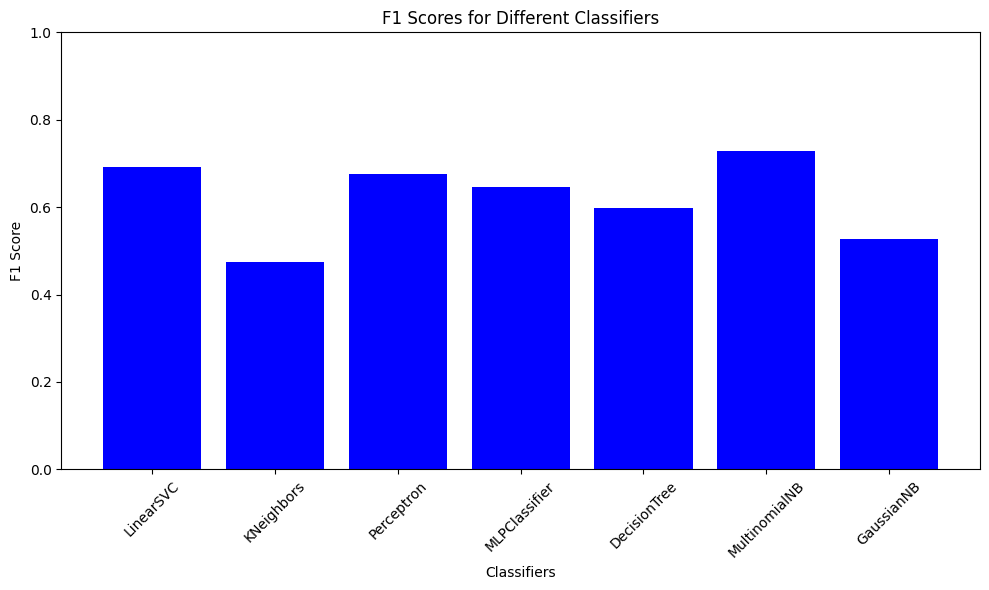

In [3]:

# Classifier names
classifiers = [
    'LinearSVC',
    'KNeighbors',
    'Perceptron',
    'MLPClassifier',
    'DecisionTree',
    'MultinomialNB',
    'GaussianNB'
]

# Corresponding F1 scores
f1_scores = [0.691, 0.475, 0.675, 0.647, 0.598, 0.729, 0.526]

plt.figure(figsize=(10, 6))
plt.bar(classifiers, f1_scores, color='blue')
plt.xlabel('Classifiers')
plt.ylabel('F1 Score')
plt.title('F1 Scores for Different Classifiers')
plt.ylim(0, 1)  # Set Y-axis limits
plt.xticks(rotation=45)  # Rotate X-axis labels for better readability

plt.tight_layout()
plt.show()


The data shows that the naïve bayes models and LinearSVC also show the best results, we will prefer to continue with the linear model

After testing all the different models of the machine including testing their hyperparameters for each model we found the most suitable learning for our machine learning

Now we need to perform a LinearSVC that fits the vectors of the model we want to check since for matching the model we need the same vectors
Therefore, we will find the largest amount of vectors suitable for us in order to create a high match and in addition we will examine the model once more with the high amount of vectors

In [417]:
new_df_t = extracted_words_df[['extracted_words']].copy()


In [ ]:
vectorizer = CountVectorizer()

# Fit and transform the extracted_words column
vectorized_words = vectorizer.fit_transform(new_df_test['extracted_words'])

# Convert the vectorized words to a DataFrame
vectorized_df = pd.DataFrame(vectorized_words.toarray(), columns=vectorizer.get_feature_names_out())

# Concatenate the vectorized DataFrame with the original DataFrame
new_df_test = pd.concat([new_df_test, vectorized_df], axis=1)

# Drop the 'extracted_words' column
new_df_test = new_df_test.drop('extracted_words', axis=1)

print(new_df_test)


In [375]:
new_df_test

,אאוט,אאכזב,אבא,אבבה,אבדוק,אבוא,אבואב,אבובים,אבוד,אבות,אבזבז,אבחן,אבחר,אבטחת,אבטלה,אבי,אביא,אביב,אביה,אבין,אביסרור,אביעד,אבישג,אבישי,אבל,אבן,אבני,אבנים,אבק,אבקש,אגב,אגו,אגוז,אגיד,אגיע,אגלה,אגם,אגמי,אגף,אגרוף,אגרש,אגרת,אדום,אדומה,אדומות,אדומים,אדוני,אדיבה,אדיבותו,אדיס,אדירה,אדישה,אדם,אדע,אדפוק,אדריכלות,אדרנלין,אה,אהב,אהבה,אהבו,אהבות,אהבת,אהבתי,אהדתי,אהוב,אהובה,אהיה,או,אובדן,אובחנתי,אובססיביות,אובססיבית,אובר,אוגוסט,אוגנדה,אודות,אוהב,אוהבים,אוהבת,אוהד,אוהדים,אוהל,אוהלים,אווי,אוויר,אווירה,אווירת,אוותר,אוזו,אוזן,אוזניים,אוחז,אוחזת,אוטו,אוטובוס,אוטובוסים,אוטוטו,אוטומטית,אוטנטי,אוטנטית,אוי,אויב,אויר,אוירה,אוכל,אוכלוסיות,אוכלוסיית,אוכלים,אוכלת,אול,אולג,אולטרה,אולי,אוליבר,אולידי,אולימפיאדת,אולימפית,אולם,אולמות,אומהה,אומנות,אומנים,אומנם,אומץ,אומר,אומרים,אומרת,אונים,אוסיף,אוסף,אוספת,אוסקר,אופורייה,אופטיים,אופטימיות,אופטימייזרים,אופטימלי,אופטיק,אופי,אופייני,אופיינית,אופיר,אופל,אופן,אופנוע,אופנועי,אופנועים,אופניים,אופנתי,אופציה,אופציות,אופקים,אופרה,אוצר,אוצרות,אוקטובר,אוקיי,אוקיינוס,אוקייקיופיד,אוקספורד,אוקראינים,אור,אורולוגיה,אורות,אורז,אורזים,אורח,אורחים,אורטופדיים,אוריד,אורך,אורכו,אורכת,אורלנדו,אושיית,אושפזתי,אושר,אות,אותה,אותו,אותי,אותיות,אותך,אותם,אותן,אותנו,אותנטיות,אז,אזהרה,אזוז,אזום,אזור,אזורים,אזורית,אזכה,אזכור,אזעקה,אזרח,אזרחי,אזרחים,אזרחית,אח,אחד,אחה,אחוז,אחוזי,אחוזים,אחורה,אחורי,אחורנית,אחורת,אחות,אחותי,אחזור,אחי,אחיה,אחיות,אחיותיי,אחיזת,אחיין,אחיינים,אחים,אחלה,אחלק,אחמדים,אחסוך,אחפש,אחר,אחראי,אחראים,אחראית,אחרון,אחרונה,אחרונות,אחרונים,אחרות,אחרי,אחריה,אחריהן,אחריו,אחריות,אחריי,אחרים,אחרינו,אחרכך,אחרת,אחרתי,אחשלי,אחת,אטוס,אטייל,אטימות,אטלנטיס,אטמוספייר,אטרקציה,אטרקציות,אי,איבד,איבדה,איבדו,איבדנו,איבדתי,איבוד,אידיאלי,אידיוט,איהיה,איום,איומה,איזה,איזו,איזון,איזור,איזורית,איזושהי,איזכורית,איזשהו,איזשהי,איזשהיא,איחוד,איחור,איחורים,איחלה,איחרנו,איטי,איטית,איטליה,איטלקית,איי,אייל,איילון,איים,איימים,אייפל,איך,איכות,איכותו,איכותי,איכותיות,איכותיים,איכותית,איכילוב,איכפת,איכשהו,אילו,אילן,אילת,אימא,אימו,אימון,אימוני,אימונים,אימוץ,אימייל,אימצנו,אימצתי,אין,אינדונזיה,אינה,אינו,אינטואיטיבית,אינטימית,אינטיסבי,אינטל,אינטליגנציה,אינטנסיבי,אינטנסיביות,אינטנסיבית,אינטרנט,אינטרסים,אינטרקציה,איני,אינך,אינם,אינסופי,אינסופיות,אינסופיים,אינסופית,אינסטגרם,אינסייד,אינספור,איסוף,איפה,איפשהו,איפשר,איפשרה,איפשרו,איצטדיון,איקס,אירגון,אירגנו,אירגנתי,אירובי,אירוח,אירוסין,אירוע,אירועים,אירופה,אירח,אירחו,אירי,איש,אישה,אישור,אישורים,אישי,אישיות,אישיים,אישית,אישר,אישרה,אישתו,אישתי,איתה,איתו,איתורן,איתי,איתך,איתם,איתמר,איתן,איתנה,איתנו,אך,אכותי,אכזבה,אכזבות,אכזרית,אכילס,אכילת,אכל,אכלה,אכלו,אכלנו,אכלתי,אכן,אכנס,אכסדרה,אכפת,אל,אלא,אלבום,אלביט,אלה,אלו,אלוהים,אלומיניום,אלונקה,אלוף,אלחץ,אלטרנטיבי,אלי,אליה,אליהו,אליהם,אליהן,אליו,אליי,אלייך,אליך,אליכם,אלים,אלינו,אליפות,אלישע,אלך,אלכוג,אלכוהול,אלכנו,אלכסנדר,אלמד,אלמוג,אלמוגים,אלמנטרי,אלסטי,אלסטית,אלעל,אלף,אלפבה,אלפי,אלפיי,אלפיים,אלפים,אלקטרוניקה,אלרגי,אלרגיה,אלרגיות,אלרגית,אם,אמ,אמא,אמבולנס,אמבולנסים,אמבטיה,אמבלונס,אמברקס,אמה,אמון,אמונה,אמונות,אמונם,אמור,אמורה,אמורות,אמורים,אמחתי,אמי,אמין,אמירה,אמירם,אמיתי,אמיתיים,אמיתית,אמן,אמנים,אמנם,אמצא,אמצע,אמצעי,אמר,אמרה,אמרו,אמריקאי,אמריקאים,אמריקאית,אמריקה,אמריקן,אמרנו,אמרתי,אמש,אמשיך,אמת,אן,אנ,אנג,אנגליה,אנגלית,אנגלס,אנגמאי,אנגרי,אנד,אנדורה,אנדרטאות,אנדרטות,אנדרטת,אנדרנלין,אנהג,אנו,אנוכי,אנונימי,אנוש,אנושית,אנחנו,אנחש,אנטוניו,אנטי,אנטיביטיקה,אנטיגואה,אנטישמיים,אנטליה,אני,אנימציה,אנליסט,אנס,אנסה,אנסינים,אנצח,אנצל,אנקוב,אנר,אנרגיה,אנרגיות,אנשי,אנשיה,אנשים,אס,אסאי,אסביר,אסון,אסור,אסטרונאוטים,אסטרטגיה,אסטרטגיות,אסיה,אסיים,אסייתי,אסיסטים,אסיר,אסלאם,אסלן,אסף,אספה,אספיק,אספנו,אספר,אספתי,אסרה,אסרטגי,אסתדר,אעבוד,אעבור,אעדכן,אעזור,אעלה,אעשה,אף,אפוד,אפוי,אפורים,אפייה,אפילו,אפיתי,אפלה,אפלו,אפליקציה,אפליקציות,אפליקצייה,אפליקציית,אפס,אפסיק,אפספס,אפקה,אפקטיבי,אפקטיבית,אפרוק,אפרורי,אפרט,אפריל,אפריקאי,אפשר,אפשרה,אפשרויות,אפשרות,אפשרי,אפשריות,אפשריים,אפשרית,אפשרתי,אצא,אצבור,אצבע,אצטרך,אציין,אציע,אצל,אצלה,אצלהם,אצלו,אצלי,אצליח,אצלינו,אצלם,אצלנו,אקבל,אקדח,אקולוגית,אקזוטיים,אקזיט,אקח,אקטיבי,אקטים,אקטננגו,אקנה,אקסטרה,אקסטרים,אקסיט,אקפוץ,אקצר,אקראיים,אקראית,אראה,ארבע,ארבעה,ארבעים,ארבעתו,ארבעתנו,ארגון,אר

In [ ]:
combined_df


In [ ]:
max_features_values = [30000]
dataframes = []  # To store dataframes for different max_features_values

for max_features in max_features_values:
    # Create a CountVectorizer instance
    vectorizer = CountVectorizer(max_features=max_features)
    
    # Fit and transform the extracted_words column
    word_counts = vectorizer.fit_transform(combined_df['extracted_words'])
    
    # Convert the resulting matrix to a DataFrame
    word_counts_df = pd.DataFrame(word_counts.toarray(), columns=vectorizer.get_feature_names_out())
    
    print(f"Max Features: {max_features}")
    print(word_counts_df)
    print("=" * 40)
    
    dataframes.append(word_counts_df)

# Access the separate dataframes
df_max_features = dataframes[0]


In [ ]:

# Get the common column names
common_columns = df_max_features.columns.intersection(new_df_test.columns)

# Create a new DataFrame with the common columns
filtered_df_max_features = df_max_features[common_columns]

# Now, filtered_df_max_features contains only the columns with names that also appear in new_df_test
filtered_df_max_features

In [379]:
X = filtered_df_max_features
y = combined_df['gender']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [381]:
param_grid = {
    'classifier__C': [0.1]
}

# Create a LinearSVC instance
linear_svc_classifier = LinearSVC(random_state=42, dual=False)  # Set dual=False for large datasets

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Standardize features
    ('classifier', linear_svc_classifier)
])

# Create a GridSearchCV instance
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_macro', verbose=1)

# Perform cross-validation
f1_scores = cross_val_score(grid_search, X_train, y_train, cv=5, scoring='f1_macro')

# Print cross-validation F1 scores
print("Cross-Validation F1 Scores:", f1_scores)
print("Mean F1 Score:", f1_scores.mean())

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best estimator and predict on test data
best_linear_svc = grid_search.best_estimator_
best_params = grid_search.best_params_
y_pred = best_linear_svc.predict(X_test)



f1_male = f1_score(y_test, y_pred, pos_label=1)
f1_female = f1_score(y_test, y_pred, pos_label=0)



F1_avg = (f1_male + f1_female) / 2

print("Best Hyperparameters:", best_params)

print("F1 Score (Male):", f1_male)
print("F1 Score (Female):", f1_female)
print("F1 Average Score:", F1_avg)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Cross-Validation F1 Scores: [0.6176822  0.59378734 0.56175672 0.59578947 0.65165278]
Mean F1 Score: 0.6041337006010965
Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('classifier',
                                        LinearSVC(dual=False,
                                                  random_state=42))]),
             param_grid={'classifier__C': [0.1]}, scoring='f1_macro',
             verbose=1)

Best Hyperparameters: {'classifier__C': 0.1}
F1 Score (Male): 0.8622222222222223
F1 Score (Female): 0.5866666666666667
F1 Average Score: 0.7244444444444444


### We managed to reach the target we wanted above 0.72

In [383]:
import joblib

model_filename = 'best_linear_svc_model.pkl'
joblib.dump(best_linear_svc, model_filename)
print(f"Trained model saved as '{model_filename}'")


['best_linear_svc_model.pkl']

Trained model saved as 'best_linear_svc_model.pkl'


In [ ]:
selected_columns = filtered_df_max_features.columns.tolist()
new_df = new_df_test[selected_columns]

new_df


In [424]:
# Load the trained model
loaded_model = joblib.load('best_linear_svc_model.pkl')

# Make predictions using the loaded model
predictions = loaded_model.predict(new_df)

# Convert predictions to a DataFrame
predictions_df = pd.DataFrame(predictions, columns=['Predicted_Label'])

# Concatenate the predictions DataFrame with the original new_df
result_df = pd.concat([new_df, predictions_df], axis=1)


In [ ]:
extracted_words_column = new_df_t['extracted_words']

predicted_label_column = result_df['Predicted_Label']

new_combined_df = pd.DataFrame({
    'extracted_words': extracted_words_column, 
    'Predicted_Label': predicted_label_column
    
})


new_combined_df


In [426]:
extracted_words_column = new_df_t['extracted_words']

predicted_label_column = result_df['Predicted_Label']

label_mapping = {1: 'm', 0: 'f'}

predicted_label_column = predicted_label_column.replace(label_mapping)

new_combined_df = pd.DataFrame({
    'extracted_words': extracted_words_column, 
    'Predicted_Label': predicted_label_column
    
})

df_predicted = new_combined_df


### Save output to csv (optional)
After you're done save your output to the 'classification_results.csv' csv file.<br/>
We assume that the dataframe with your results contain the following columns:
* column 1 (left column): 'test_example_id'  - the same id associated to each of the test stories to be predicted.
* column 2 (right column): 'predicted_category' - the predicted gender value for each of the associated story. 

Assuming your predicted values are in the `df_predicted` dataframe, you should save you're results as following:

In [405]:
df_predicted.to_csv('classification_results.csv',index=False)